In [1]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as T
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random # Reproducibility
import time
import cv2

from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

In [2]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [3]:

PROJECT_ROOT = Path().resolve().parent
DATA_DIR = PROJECT_ROOT / "data"
PROCESSED_DIR = DATA_DIR / "processed"

csv_path = PROCESSED_DIR / "person_clean_dataset.csv"

df = pd.read_csv(csv_path)
print("Rows in dataset:", len(df))
df.head()

Rows in dataset: 1768


,image_id,image_path,XMin,XMax,YMin,YMax
0,03824eac0cc9293f,../data/raw_images/train/person/03824eac0cc929...,0.597500,0.787500,0.464167,0.666667
1,00cb2903a338b1ed,../data/raw_images/train/person/00cb2903a338b1...,0.175000,0.936875,0.115000,1.000000
2,038259d823c904fa,../data/raw_images/train/person/038259d823c904...,0.160625,0.953750,0.229462,0.999056
3,03df2f11c8dc6c6f,../data/raw_images/train/person/03df2f11c8dc6c...,0.343750,0.400000,0.719745,0.823248
4,00cb425fe48db51a,../data/raw_images/train/person/00cb425fe48db5...,0.057500,0.968125,0.090833,0.990000


In [4]:
# compute center (xc, yc) and width/height (w, h) in normalized [0,1]
df["xc"] = (df["XMin"] + df["XMax"]) / 2.0
df["yc"] = (df["YMin"] + df["YMax"]) / 2.0
df["w"]  = df["XMax"] - df["XMin"]
df["h"]  = df["YMax"] - df["YMin"]

df[["image_path", "xc", "yc", "w", "h"]].head()


,image_path,xc,yc,w,h
0,../data/raw_images/train/person/03824eac0cc929...,0.692500,0.565417,0.190000,0.202500
1,../data/raw_images/train/person/00cb2903a338b1...,0.555937,0.557500,0.761875,0.885000
2,../data/raw_images/train/person/038259d823c904...,0.557187,0.614259,0.793125,0.769594
3,../data/raw_images/train/person/03df2f11c8dc6c...,0.371875,0.771497,0.056250,0.103503
4,../data/raw_images/train/person/00cb425fe48db5...,0.512813,0.540416,0.910625,0.899167


In [5]:
train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    random_state=42,
    shuffle=True,
)

len(train_df), len(val_df)

(1414, 354)

In [6]:
class CropDataset(Dataset):
    def __init__(self, df, transform=None, image_size=224, max_retries=10):
        self.df = df.reset_index(drop=True)
        self.transform = transform
        self.image_size = image_size
        self.max_retries = max_retries

        # basic transform if none provided
        if self.transform is None:
            self.transform = T.Compose([
                T.Resize((image_size, image_size)),
                T.ToTensor(),
                # normalize with ImageNet stats (good default)
                T.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225]),
            ])

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # Retry sampling if file is missing/corrupt
        for _ in range(self.max_retries):
            row = self.df.iloc[idx]
            img_path = row["image_path"]

            # If file missing, resample another index
            if not os.path.exists(img_path):
                idx = random.randint(0, len(self.df) - 1)
                continue

            try:
                img = Image.open(img_path).convert("RGB")
            except Exception:
                # Corrupt/unreadable file: resample
                idx = random.randint(0, len(self.df) - 1)
                continue

            # normalized target box (already [0,1])
            target = np.array([row["xc"], row["yc"], row["w"], row["h"]], dtype=np.float32)

            img = self.transform(img)
            target = torch.tensor(target, dtype=torch.float32)

            return img, target

        # If too many failures, raise a clear error
        raise RuntimeError(
            f"CropDataset: exceeded max_retries={self.max_retries} for missing/corrupt images. "
            "Consider filtering df['image_path'] to existing files."
        )

In [ ]:
IMAGE_SIZE = 224
BATCH_SIZE = 16

train_dataset = CropDataset(train_df, image_size=IMAGE_SIZE)
val_dataset   = CropDataset(val_df, image_size=IMAGE_SIZE)

g = torch.Generator()
g.manual_seed(SEED)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, generator=g)

val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

len(train_loader), len(val_loader)

(89, 23)

In [ ]:
class PatchEmbedding(nn.Module):
    def __init__(self, patch_size=16, in_chans=3, embed_dim=128):
        super().__init__()
        self.patch_size = patch_size
        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        # x: (B, C, H, W) -> (B, D, Hp, Wp)
        x = self.proj(x)
        Hp, Wp = x.shape[-2], x.shape[-1]
        x = x.flatten(2).transpose(1, 2)  # (B, Hp*Wp, D)
        return x, (Hp, Wp)


class TransformerEncoderBlock(nn.Module):
    def __init__(self, dim, num_heads=4, mlp_ratio=4.0, dropout=0.0):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn = nn.MultiheadAttention(dim, num_heads, dropout=dropout, batch_first=True)
        self.norm2 = nn.LayerNorm(dim)

        hidden_dim = int(dim * mlp_ratio)
        self.mlp = nn.Sequential(
            nn.Linear(dim, hidden_dim),
            nn.GELU(),
            nn.Linear(hidden_dim, dim),
        )

    def forward(self, x):
        # x: (B, N, D)
        x_norm = self.norm1(x)
        attn_out, _ = self.attn(x_norm, x_norm, x_norm)
        x = x + attn_out

        x_norm = self.norm2(x)
        x = x + self.mlp(x_norm)
        return x

In [9]:
class TinyViTBackbone(nn.Module):
    """
    ViT-style tiny backbone:
      - Patch embed
      - CLS token
      - (Interpolated) learned positional embedding
      - Transformer encoder blocks
      - Return CLS representation (B, D)

    Key correction:
      - Pads to make H/W divisible by patch_size (instead of cropping away pixels).
    """
    def __init__(
        self,
        patch_size: int = 16,
        embed_dim: int = 128,
        depth: int = 2,
        num_heads: int = 4,
        base_img_size: int = 224,
    ):
        super().__init__()
        self.patch_size = patch_size
        self.embed_dim = embed_dim

        self.patch_embed = PatchEmbedding(
            patch_size=patch_size,
            in_chans=3,
            embed_dim=embed_dim
        )

        # base grid (e.g., 224/16 = 14)
        self.base_grid = (base_img_size // patch_size, base_img_size // patch_size)
        base_num_patches = self.base_grid[0] * self.base_grid[1]

        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        self.pos_embed = nn.Parameter(torch.zeros(1, base_num_patches + 1, embed_dim))

        self.blocks = nn.ModuleList([
            TransformerEncoderBlock(embed_dim, num_heads=num_heads)
            for _ in range(depth)
        ])
        self.norm = nn.LayerNorm(embed_dim)

        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)

    def _interpolate_pos_embed(self, Hp: int, Wp: int) -> torch.Tensor:
        """
        Interpolate patch positional embeddings from base_grid to (Hp, Wp).
        Returns (1, 1 + Hp*Wp, D).
        """
        cls_pos = self.pos_embed[:, :1, :]      # (1, 1, D)
        patch_pos = self.pos_embed[:, 1:, :]    # (1, base_num_patches, D)

        Gh0, Gw0 = self.base_grid
        D = patch_pos.shape[-1]

        # (1, base_num_patches, D) -> (1, D, Gh0, Gw0)
        patch_pos = patch_pos.reshape(1, Gh0, Gw0, D).permute(0, 3, 1, 2)

        # interpolate to (Hp, Wp)
        patch_pos = F.interpolate(
            patch_pos,
            size=(Hp, Wp),
            mode="bicubic",
            align_corners=False
        )

        # (1, D, Hp, Wp) -> (1, Hp*Wp, D)
        patch_pos = patch_pos.permute(0, 2, 3, 1).reshape(1, Hp * Wp, D)

        return torch.cat([cls_pos, patch_pos], dim=1)  # (1, 1 + Hp*Wp, D)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        x: (B, 3, H, W)
        returns: (B, D) CLS features
        """
        B, _, H, W = x.shape

        # Pad so H/W divisible by patch_size (safer than cropping content away)
        pad_h = (self.patch_size - (H % self.patch_size)) % self.patch_size
        pad_w = (self.patch_size - (W % self.patch_size)) % self.patch_size
        if pad_h or pad_w:
            x = F.pad(x, (0, pad_w, 0, pad_h), mode="constant", value=0.0)

        # Patch embed: tokens (B, Hp*Wp, D), and grid (Hp, Wp)
        tokens, (Hp, Wp) = self.patch_embed(x)

        # Add CLS
        cls_tokens = self.cls_token.expand(B, -1, -1)       # (B, 1, D)
        x = torch.cat((cls_tokens, tokens), dim=1)          # (B, 1+N, D)

        # Add (interpolated) pos enc
        pos = self._interpolate_pos_embed(Hp, Wp).to(dtype=x.dtype, device=x.device)
        x = x + pos

        # Transformer blocks
        for blk in self.blocks:
            x = blk(x)

        x = self.norm(x)
        return x[:, 0]  # CLS


class CropRegressor(nn.Module):
    def __init__(self, embed_dim=128, hidden_dim=128, min_wh=0.05):
        super().__init__()
        self.min_wh = float(min_wh)

        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, hidden_dim),
            nn.ReLU(inplace=True),
            nn.Linear(hidden_dim, 4),
            nn.Sigmoid(),
        )

    def forward(self, feats):
        out = self.mlp(feats)  # (B,4) in (0,1)

        xc = out[:, 0]
        yc = out[:, 1]
        w  = out[:, 2].clamp(min=self.min_wh)
        h  = out[:, 3].clamp(min=self.min_wh)

        half_w = 0.5 * w
        half_h = 0.5 * h

        xc = xc.clamp(min=half_w, max=1.0 - half_w)
        yc = yc.clamp(min=half_h, max=1.0 - half_h)

        # rebuild tensor (NOT in-place)
        return torch.stack([xc, yc, w, h], dim=1)



In [10]:
class TinyViTCropModel(nn.Module):
    def __init__(self, img_size=224, patch_size=16, embed_dim=128, depth=2, num_heads=4):
        super().__init__()
        self.backbone = TinyViTBackbone(
            # img_size=img_size,
            patch_size=patch_size,
            embed_dim=embed_dim,
            depth=depth,
            num_heads=num_heads,
            base_img_size=224,  # keep this fixed as the reference grid
        )
        
        self.head = CropRegressor(embed_dim=embed_dim)

    def forward(self, x):
        feats = self.backbone(x)          # (B, D)
        pred_boxes = self.head(feats)     # (B, 4), normalized
        return pred_boxes


In [11]:
def box_xywh_to_xyxy(box, eps=1e-6):
    """
    box: (B,4) in (xc,yc,w,h), assumed normalized (0..1)
    returns (B,4) in (x1,y1,x2,y2), clipped to (0..1)
    """
    xc, yc, w, h = box[:, 0], box[:, 1], box[:, 2], box[:, 3]
    w = w.clamp(min=eps)
    h = h.clamp(min=eps)

    x1 = (xc - 0.5 * w)
    y1 = (yc - 0.5 * h)
    x2 = (xc + 0.5 * w)
    y2 = (yc + 0.5 * h)

    xyxy = torch.stack([x1, y1, x2, y2], dim=1)
    return xyxy.clamp(0.0, 1.0)

def iou_loss(pred, target, eps=1e-6, giou=False, reduction="mean"):
    """
    pred, target: (B,4) in [0,1] as (xc,yc,w,h)
    Returns: 1 - IoU (or 1 - GIoU)
    """
    pred_xyxy = box_xywh_to_xyxy(pred, eps=eps)
    tgt_xyxy  = box_xywh_to_xyxy(target, eps=eps)

    # Intersection
    x1 = torch.max(pred_xyxy[:, 0], tgt_xyxy[:, 0])
    y1 = torch.max(pred_xyxy[:, 1], tgt_xyxy[:, 1])
    x2 = torch.min(pred_xyxy[:, 2], tgt_xyxy[:, 2])
    y2 = torch.min(pred_xyxy[:, 3], tgt_xyxy[:, 3])

    inter_w = (x2 - x1).clamp(min=0)
    inter_h = (y2 - y1).clamp(min=0)
    inter = inter_w * inter_h

    # Areas
    area_pred = (pred_xyxy[:, 2] - pred_xyxy[:, 0]).clamp(min=0) * \
                (pred_xyxy[:, 3] - pred_xyxy[:, 1]).clamp(min=0)
    area_tgt  = (tgt_xyxy[:, 2] - tgt_xyxy[:, 0]).clamp(min=0) * \
                (tgt_xyxy[:, 3] - tgt_xyxy[:, 1]).clamp(min=0)

    union = area_pred + area_tgt - inter + eps
    iou = inter / union  # (B,)

    if giou:
        # Enclosing box
        cx1 = torch.min(pred_xyxy[:, 0], tgt_xyxy[:, 0])
        cy1 = torch.min(pred_xyxy[:, 1], tgt_xyxy[:, 1])
        cx2 = torch.max(pred_xyxy[:, 2], tgt_xyxy[:, 2])
        cy2 = torch.max(pred_xyxy[:, 3], tgt_xyxy[:, 3])

        c_area = (cx2 - cx1).clamp(min=0) * (cy2 - cy1).clamp(min=0) + eps
        giou_val = iou - (c_area - union) / c_area
        loss_vec = 1.0 - giou_val
    else:
        loss_vec = 1.0 - iou

    if reduction == "mean":
        return loss_vec.mean()
    if reduction == "sum":
        return loss_vec.sum()
    return loss_vec

smooth_l1 = nn.SmoothL1Loss()


In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# model = TinyViTCropModel(img_size=IMAGE_SIZE).to(device)
model = TinyViTCropModel().to(device)


optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5, weight_decay=1e-4) #lr=1e-4
num_epochs = 15  # you can increase later

print("Device:", torch.device("cuda" if torch.cuda.is_available() else "cpu"))
print("Train samples:", len(train_df))
print("Val samples:", len(val_df))

Using device: cpu
Device: cpu
Train samples: 1414
Val samples: 354


In [13]:
def train_one_epoch(model, loader, optimizer, device, epoch=None):
    model.train()
    total_loss = 0.0
    start_time = time.time()

    for batch_idx, (imgs, targets) in enumerate(loader, start=1):
        imgs = imgs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        preds = model(imgs)

        l1 = smooth_l1(preds, targets)
        iou = iou_loss(preds, targets)
        loss = l1 + iou

        loss.backward()
        optimizer.step()

        total_loss += loss.item() * imgs.size(0)

    epoch_loss = total_loss / len(loader.dataset)
    epoch_time = time.time() - start_time
    print(f"→ Epoch {epoch} finished in {epoch_time:.2f}s | Train Loss: {epoch_loss:.4f}")
    return epoch_loss, epoch_time


@torch.no_grad()
def eval_one_epoch(model, loader, device, epoch=None):
    model.eval()
    total_loss = 0.0

    for batch_idx, (imgs, targets) in enumerate(loader, start=1):
        imgs = imgs.to(device)
        targets = targets.to(device)

        preds = model(imgs)
        l1 = smooth_l1(preds, targets)
        iou = iou_loss(preds, targets)
        loss = l1 + iou

        total_loss += loss.item() * imgs.size(0)

    epoch_loss = total_loss / len(loader.dataset)
    print(f"→ Eval Epoch {epoch} | Val Loss: {epoch_loss:.4f}")
    return epoch_loss


# MAIN TRAINING LOOP
training_log = []


for epoch in range(1, num_epochs + 1):
    train_loss, epoch_time = train_one_epoch(
        model, train_loader, optimizer, device, epoch=epoch
    )

    val_loss = eval_one_epoch(
        model, val_loader, device, epoch=epoch
    )

    training_log.append({
        "epoch": epoch,
        "train_loss": train_loss,
        "val_loss": val_loss,
        "epoch_time_sec": epoch_time,
        "learning_rate": optimizer.param_groups[0]["lr"],
    })

    print("-" * 70)

training_df = pd.DataFrame(training_log)
training_df

→ Epoch 1 finished in 43.51s | Train Loss: 0.7146
→ Eval Epoch 1 | Val Loss: 0.6884
----------------------------------------------------------------------
→ Epoch 2 finished in 40.49s | Train Loss: 0.6736
→ Eval Epoch 2 | Val Loss: 0.6737
----------------------------------------------------------------------
→ Epoch 3 finished in 41.36s | Train Loss: 0.6657
→ Eval Epoch 3 | Val Loss: 0.6698
----------------------------------------------------------------------
→ Epoch 4 finished in 38.29s | Train Loss: 0.6630
→ Eval Epoch 4 | Val Loss: 0.6685
----------------------------------------------------------------------
→ Epoch 5 finished in 37.51s | Train Loss: 0.6610
→ Eval Epoch 5 | Val Loss: 0.6648
----------------------------------------------------------------------
→ Epoch 6 finished in 36.42s | Train Loss: 0.6598
→ Eval Epoch 6 | Val Loss: 0.6642
----------------------------------------------------------------------
→ Epoch 7 finished in 36.84s | Train Loss: 0.6586
→ Eval Epoch 7 | Val

,epoch,train_loss,val_loss,epoch_time_sec,learning_rate
0,1,0.714648,0.688415,43.505865,0.00001
1,2,0.673570,0.673725,40.493969,0.00001
2,3,0.665651,0.669787,41.364276,0.00001
3,4,0.662960,0.668513,38.294590,0.00001
4,5,0.660979,0.664842,37.511844,0.00001
5,6,0.659752,0.664232,36.422458,0.00001
6,7,0.658629,0.667229,36.842613,0.00001
7,8,0.658242,0.662434,36.728210,0.00001
8,9,0.656631,0.661891,36.521552,0.00001
9,10,0.655704,0.662460,37.557672,0.00001


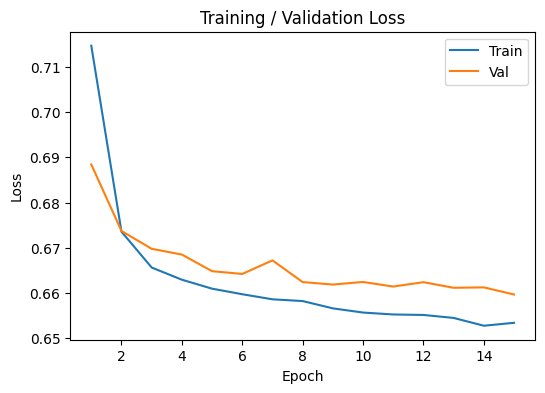

In [14]:
plt.figure(figsize=(6,4))

plt.plot(training_df["epoch"], training_df["train_loss"], label="Train")
plt.plot(training_df["epoch"], training_df["val_loss"], label="Val")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training / Validation Loss")
plt.legend()
plt.show()


The supervised TinyViT crop regression model converged after fine-tuning at a learning rate of 1e-5, with stable and smoothly decreasing training and validation losses. Further training yielded diminishing returns, indicating convergence.

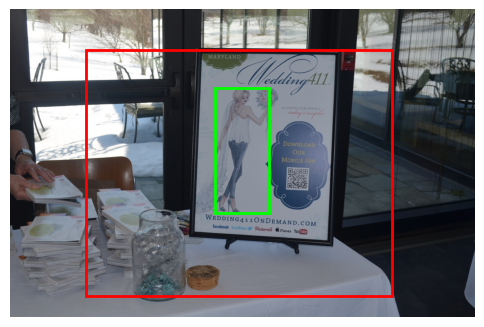

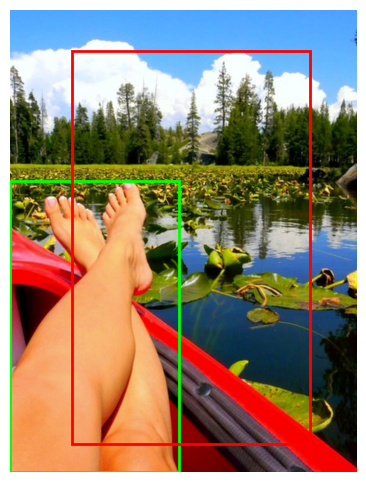

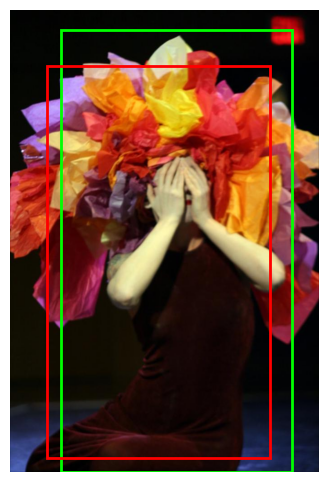

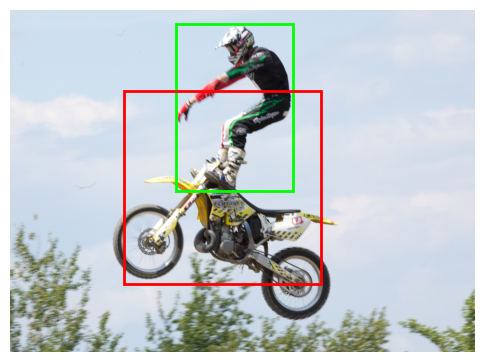

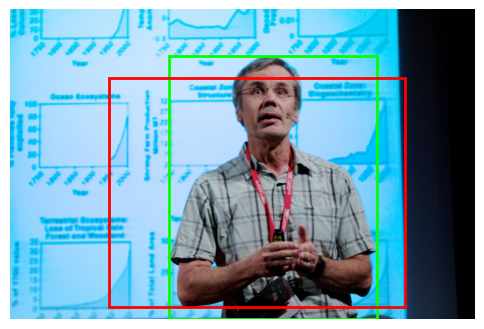

In [15]:
@torch.no_grad()
def visualize_predictions(model, df_sample, num_samples=5):
    model.eval()
    for i in range(num_samples):
        row = df_sample.sample(1).iloc[0]
        img_path = row["image_path"]
        img = Image.open(img_path).convert("RGB")
        w, h = img.size

        # prepare input
        x = train_dataset.transform(img).unsqueeze(0).to(device)  # reuse transform
        pred = model(x).cpu().squeeze(0).numpy()

        # gt & pred boxes (xc,yc,w,h)
        gt = np.array([row["xc"], row["yc"], row["w"], row["h"]])

        def xywh_to_xyxy(box):
            xc, yc, bw, bh = box
            x1 = (xc - bw/2) * w
            y1 = (yc - bh/2) * h
            x2 = (xc + bw/2) * w
            y2 = (yc + bh/2) * h
            return x1, y1, x2, y2

        gt_x1, gt_y1, gt_x2, gt_y2 = xywh_to_xyxy(gt)
        pr_x1, pr_y1, pr_x2, pr_y2 = xywh_to_xyxy(pred)

        fig, ax = plt.subplots(1, figsize=(6,6))
        ax.imshow(img)

        # GT in green
        ax.add_patch(
            patches.Rectangle(
                (gt_x1, gt_y1),
                gt_x2 - gt_x1, gt_y2 - gt_y1,
                linewidth=2, edgecolor="lime", facecolor="none", label="GT"
            )
        )
        # Pred in red
        ax.add_patch(
            patches.Rectangle(
                (pr_x1, pr_y1),
                pr_x2 - pr_x1, pr_y2 - pr_y1,
                linewidth=2, edgecolor="red", facecolor="none", label="Pred"
            )
        )

        plt.axis("off")
        plt.show()


visualize_predictions(model, val_df, num_samples=5)


After convergence, the supervised TinyViT crop regression model was frozen and used as a fixed baseline for further evaluation and reinforcement learning refinement.

In [16]:
torch.save(
    {
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "epoch": epoch,
    },
    "../models/tinyvit_supervised_final_ckpt.pth"
)


In [17]:
ckpt = torch.load("../models/tinyvit_supervised_final_ckpt.pth", map_location=device)
model.load_state_dict(ckpt["model_state_dict"])


<All keys matched successfully>

In [18]:
model.eval()
for p in model.parameters():
    p.requires_grad = False


In [19]:
# Freeze supervised cropper
supervised_model = model   # rename for clarity
supervised_model.eval()

for p in supervised_model.parameters():
    p.requires_grad = False

# Sanity check (should be False)
any(p.requires_grad for p in supervised_model.parameters())


False

In [20]:
ACTIONS = {
    0: "pan_left",
    1: "pan_right",
    2: "pan_up",
    3: "pan_down",
    4: "zoom_in",
    5: "zoom_out",
    6: "stop"
}

NUM_ACTIONS = len(ACTIONS)


In [21]:
def clamp_box(box):
    xc, yc, w, h = box
    w = max(0.05, min(w, 1.0))
    h = max(0.05, min(h, 1.0))
    xc = min(max(xc, w/2), 1 - w/2)
    yc = min(max(yc, h/2), 1 - h/2)
    return np.array([xc, yc, w, h])


def box_to_corners(box):
    xc, yc, w, h = box
    return [
        xc - w/2, yc - h/2,
        xc + w/2, yc + h/2
    ]


def compute_iou(boxA, boxB):
    ax1, ay1, ax2, ay2 = box_to_corners(boxA)
    bx1, by1, bx2, by2 = box_to_corners(boxB)

    inter_x1 = max(ax1, bx1)
    inter_y1 = max(ay1, by1)
    inter_x2 = min(ax2, bx2)
    inter_y2 = min(ay2, by2)

    inter_area = max(0, inter_x2 - inter_x1) * max(0, inter_y2 - inter_y1)
    areaA = (ax2 - ax1) * (ay2 - ay1)
    areaB = (bx2 - bx1) * (by2 - by1)

    return inter_area / (areaA + areaB - inter_area + 1e-6)


In [22]:
def rule_of_thirds_reward(xc, yc):
    thirds = [1/3, 2/3]
    dx = min(abs(xc - t) for t in thirds)
    dy = min(abs(yc - t) for t in thirds)
    dist = np.sqrt(dx**2 + dy**2)
    return max(0.0, 0.15 - dist)


In [23]:
def subject_center_from_gt(gt_box):
    # gt_box already in (xc, yc, w, h)
    return gt_box[0], gt_box[1]

def subject_alignment_reward(crop_box, gt_box):
    # Reward crop center close to subject center (0..1)
    cx, cy, _, _ = crop_box
    sx, sy = subject_center_from_gt(gt_box)
    dist = np.sqrt((cx - sx)**2 + (cy - sy)**2)  # 0..~1.4
    # Convert to reward: close -> near 1, far -> 0
    return max(0.0, 1.0 - dist / 0.5)  # 0.5 is a “tolerance” hyperparam

def edge_cut_penalty(crop_box, gt_box, margin=0.05):
    # Penalize if crop is too tight around GT, likely “cutting” subject
    x1, y1, x2, y2 = box_to_corners(crop_box)
    gx1, gy1, gx2, gy2 = box_to_corners(gt_box)

    # distance from GT box to crop borders
    left   = gx1 - x1
    top    = gy1 - y1
    right  = x2 - gx2
    bottom = y2 - gy2

    # If any side margin < margin -> penalty
    pen = 0.0
    for m in [left, top, right, bottom]:
        if m < margin:
            pen += (margin - m)  # more cut => higher penalty
    return pen  # continuous penalty

def aspect_ratio_penalty(crop_box, target_ratio=1.0, tol=0.4):
    # Penalize aspect ratios far from target_ratio (e.g., 1.0 = square)
    _, _, w, h = crop_box
    r = (w / (h + 1e-6))
    diff = abs(r - target_ratio)
    return max(0.0, diff - tol)  # penalty only after tolerance

def headroom_reward(crop_box, gt_box, target=0.08):
    x1, y1, x2, y2 = box_to_corners(crop_box)
    gx1, gy1, gx2, gy2 = box_to_corners(gt_box)
    headroom = gy1 - y1  # positive if crop extends above GT top
    return max(0.0, min(1.0, headroom / target))

def cinematic_wide_reward(box, target_ratio=16/9, tol=0.3):
    w, h = box[2], box[3]
    ratio = w / (h + 1e-6)
    return -abs(ratio - target_ratio) / tol

def leading_space_reward(xc, direction, strength=0.5):
    """
    xc: subject center in [0,1]
    direction: -1 for left, +1 for right
    """
    # Map xc to signed space offset
    offset = (0.5 - xc) * direction
    return offset / strength





In [24]:
class CropEnv:
    def __init__(self, image, gt_box, init_box, max_steps=10):
        self.image = image
        self.gt_box = gt_box
        self.box = init_box.copy()
        self.max_steps = max_steps
        self.steps = 0
        self.prev_iou = compute_iou(self.box, self.gt_box)
        
    def reset(self):
        self.steps = 0
        self.prev_iou = compute_iou(self.box, self.gt_box)
        return self.get_state()

    def get_crop(self):
        h, w, _ = self.image.shape
        x1, y1, x2, y2 = box_to_corners(self.box)
        x1, x2 = int(x1 * w), int(x2 * w)
        y1, y2 = int(y1 * h), int(y2 * h)
        return self.image[y1:y2, x1:x2]

    def get_state(self):
        crop = cv2.resize(self.get_crop(), (96, 96))
        crop = torch.tensor(crop).permute(2, 0, 1).float() / 255.0
        coords = torch.tensor(self.box).float()
        return crop.unsqueeze(0), coords.unsqueeze(0)

    def step(self, action):
        step = 0.05

        if action == 0: self.box[0] -= step
        if action == 1: self.box[0] += step
        if action == 2: self.box[1] -= step
        if action == 3: self.box[1] += step
        if action == 4: self.box[2] *= 0.9; self.box[3] *= 0.9
        if action == 5: self.box[2] *= 1.1; self.box[3] *= 1.1

        self.box = clamp_box(self.box)
        self.steps += 1

        curr_iou = compute_iou(self.box, self.gt_box)

        # (A) Base: IoU improvement (stability term)
        reward = (curr_iou - self.prev_iou)

        # (B) Hard subject loss penalty
        if curr_iou < 0.2:
            reward -= 0.4

        # (C) Prevent tiny crops / zoom collapse
        crop_area = self.box[2] * self.box[3]
        if crop_area < 0.15:
            reward -= 0.15

        # (D) New: subject alignment (stronger than thirds)
        reward += 0.15 * subject_alignment_reward(self.box, self.gt_box)

        # (E) New: Rule of Thirds (moderate)
        reward += 0.05 * rule_of_thirds_reward(self.box[0], self.box[1])

        # (F) New: edge-cut penalty (discourage chopping)
        reward -= 0.10 * edge_cut_penalty(self.box, self.gt_box, margin=0.05)

        # (G) New: weird aspect ratio penalty (keep crop stable)
        reward -= 0.1 * aspect_ratio_penalty(self.box)

        reward += 0.05 * headroom_reward(self.box, self.gt_box)

        reward += 0.06 * cinematic_wide_reward(self.box)

        reward += 0.05 * leading_space_reward(self.box[0], direction=+1)  # right
        
        reward += 0.05 * leading_space_reward(self.box[0], direction=-1)  # left

        self.prev_iou = curr_iou

        done = (action == 6) or (self.steps >= self.max_steps) or (curr_iou < 0.1)

        return self.get_state(), reward, done


    def compute_iou(self, coords):
        # ---- ensure coords is a torch tensor ----
        if not torch.is_tensor(coords):
            coords = torch.tensor(coords, dtype=torch.float32)
        else:
            coords = coords.float()

        # ---- ensure gt_box is a torch tensor ----
        gt = self.gt_box
        if not torch.is_tensor(gt):
            gt = torch.tensor(gt, dtype=torch.float32)
        else:
            gt = gt.float()

        # ---- move both to same device (use coords device as source of truth) ----
        device = coords.device
        gt = gt.to(device)

        # ---- reshape/validate ----
        coords = coords.view(-1)
        if coords.numel() != 4:
            raise ValueError(
                f"[compute_iou] Expected coords with 4 values (xc,yc,w,h), "
                f"got shape {tuple(coords.shape)} numel={coords.numel()} value={coords}"
            )
        coords = coords.view(1, 4)

        gt = gt.view(-1)
        if gt.numel() != 4:
            raise ValueError(
                f"[compute_iou] Expected gt_box with 4 values (xc,yc,w,h), "
                f"got numel={gt.numel()} value={gt}"
            )
        gt = gt.view(1, 4)

        # ---- compute scalar IoU ----
        return 1.0 - iou_loss(coords, gt).item()




In [25]:
class CropPolicy(nn.Module):
    def __init__(self, num_actions=NUM_ACTIONS):
        super().__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((4, 4))  # 🔑 FIX
        )

        # 32 * 4 * 4 = 512
        self.fc = nn.Linear(512 + 4, num_actions)

    def forward(self, img, coords):
        x = self.conv(img)
        x = x.view(x.size(0), -1)
        x = torch.cat([x, coords], dim=1)
        return self.fc(x)


In [26]:
policy = CropPolicy().to(device)
rl_optimizer = optim.Adam(policy.parameters(), lr=1e-3)


In [27]:
def run_episode(env, policy):
    log_probs = []
    rewards = []

    img, coords = env.reset()

    # ---- IoU BEFORE RL ----
    with torch.no_grad():
        initial_iou = env.compute_iou(coords)

    done = False

    while not done:
        img = img.to(device)
        coords = coords.to(device)

        logits = policy(img, coords)
        dist = torch.distributions.Categorical(logits=logits)

        action = dist.sample()
        log_probs.append(dist.log_prob(action))

        (img, coords), reward, done = env.step(action.item())
        rewards.append(reward)

    # ---- IoU AFTER RL ----
    with torch.no_grad():
        final_iou = env.compute_iou(coords)

    delta_iou = final_iou - initial_iou

    return log_probs, rewards, float(delta_iou)

from torchvision import transforms

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


In [28]:
# Pick one sample from validation set
sample = val_df.iloc[0]

# Load image
img_path = sample["image_path"]
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Ground-truth box (normalized)
gt_box = np.array([
    sample["xc"],
    sample["yc"],
    sample["w"],
    sample["h"]
])

# Get initial crop from supervised model
with torch.no_grad():
    img_tensor = transform(image).unsqueeze(0).to(device)  # same transform as training
    pred_box = supervised_model(img_tensor).cpu().numpy()[0]

init_box = clamp_box(pred_box)

# Create environment
env = CropEnv(
    image=image,
    gt_box=gt_box,
    init_box=init_box,
    max_steps=10
)

init_crop = CropEnv(image=image, gt_box=gt_box, init_box=init_box, max_steps=1).get_crop()

env

In [29]:
init_iou = compute_iou(env.box, env.gt_box)
print("Initial IoU (supervised vs GT):", round(init_iou, 4))
print("Init box:", env.box)
print("GT box:  ", env.gt_box)

Initial IoU (supervised vs GT): 0.817
Init box: [0.48855132 0.55489165 0.717132   0.83863705]
GT box:   [0.4448255 0.542791  0.710075  0.912558 ]


In [30]:
NUM_EPISODES = 50

for episode in range(1, NUM_EPISODES + 1):
    log_probs, rewards, delta_iou = run_episode(env, policy)

    returns = torch.tensor(rewards, dtype=torch.float32, device=device)
    returns = returns - returns.mean()

    loss = -(torch.stack(log_probs) * returns).sum()

    rl_optimizer.zero_grad()
    loss.backward()
    rl_optimizer.step()

    print(
        f"Episode {episode:02d} | "
        f"Total Reward: {sum(rewards):.3f} | "
        f"ΔIoU: {delta_iou:+.4f}"
    )

Episode 01 | Total Reward: -1.008 | ΔIoU: -0.1821
Episode 02 | Total Reward: -0.938 | ΔIoU: -0.1660
Episode 03 | Total Reward: -0.680 | ΔIoU: -0.0009
Episode 04 | Total Reward: -1.212 | ΔIoU: +0.1085
Episode 05 | Total Reward: -1.249 | ΔIoU: +0.0341
Episode 06 | Total Reward: -0.745 | ΔIoU: +0.1358
Episode 07 | Total Reward: -0.247 | ΔIoU: -0.1065
Episode 08 | Total Reward: -0.357 | ΔIoU: +0.1132
Episode 09 | Total Reward: -0.836 | ΔIoU: -0.0893
Episode 10 | Total Reward: -0.679 | ΔIoU: -0.0680
Episode 11 | Total Reward: -0.351 | ΔIoU: +0.0000
Episode 12 | Total Reward: -0.807 | ΔIoU: +0.0582
Episode 13 | Total Reward: -0.223 | ΔIoU: -0.0434
Episode 14 | Total Reward: -1.825 | ΔIoU: -0.2776
Episode 15 | Total Reward: -0.982 | ΔIoU: -0.0441
Episode 16 | Total Reward: -0.388 | ΔIoU: +0.0000
Episode 17 | Total Reward: -0.725 | ΔIoU: +0.0368
Episode 18 | Total Reward: -1.346 | ΔIoU: +0.0721
Episode 19 | Total Reward: -0.281 | ΔIoU: +0.0746
Episode 20 | Total Reward: -1.544 | ΔIoU: -0.1168


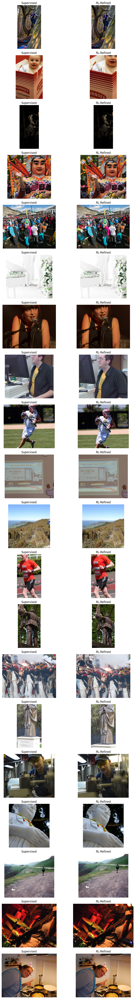

In [31]:


NUM_SAMPLES = 20

valid_indices = list(range(len(val_df)))
random.shuffle(valid_indices)

shown = 0
i = 0

plt.figure(figsize=(10, NUM_SAMPLES * 3))

while shown < NUM_SAMPLES and i < len(valid_indices):
    idx = valid_indices[i]
    i += 1

    sample = val_df.iloc[idx]
    img_path = sample["image_path"]

    # ---- load image safely ----
    image = cv2.imread(img_path)
    if image is None:
        continue

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Ground-truth box
    gt_box = np.array([
        sample["xc"],
        sample["yc"],
        sample["w"],
        sample["h"]
    ], dtype=np.float32)

    # Supervised prediction
    with torch.no_grad():
        img_tensor = transform(image).unsqueeze(0).to(device)
        pred_box = supervised_model(img_tensor).cpu().numpy()[0]

    init_box = clamp_box(pred_box)

    # Create RL environment
    env = CropEnv(
        image=image,
        gt_box=gt_box,
        init_box=init_box,
        max_steps=10
    )

    # Run ONE RL episode (inference only)
    with torch.no_grad():
        run_episode(env, policy)

    # Get crops
    supervised_crop = CropEnv(image, gt_box, init_box).get_crop()
    rl_crop = env.get_crop()

    # Plot
    plt.subplot(NUM_SAMPLES, 2, shown * 2 + 1)
    plt.imshow(supervised_crop)
    plt.title("Supervised")
    plt.axis("off")

    plt.subplot(NUM_SAMPLES, 2, shown * 2 + 2)
    plt.imshow(rl_crop)
    plt.title("RL-Refined")
    plt.axis("off")

    shown += 1

plt.tight_layout()
plt.show()


In [32]:
TEST_DIR = Path("../images/test")
test_images = list(TEST_DIR.glob("*.jpg")) + list(TEST_DIR.glob("*.png"))

print(f"Found {len(test_images)} test images")

Found 7 test images


In [33]:
def dummy_gt_box():
    # Centered, moderate size prior
    return np.array([0.5, 0.5, 0.6, 0.8])

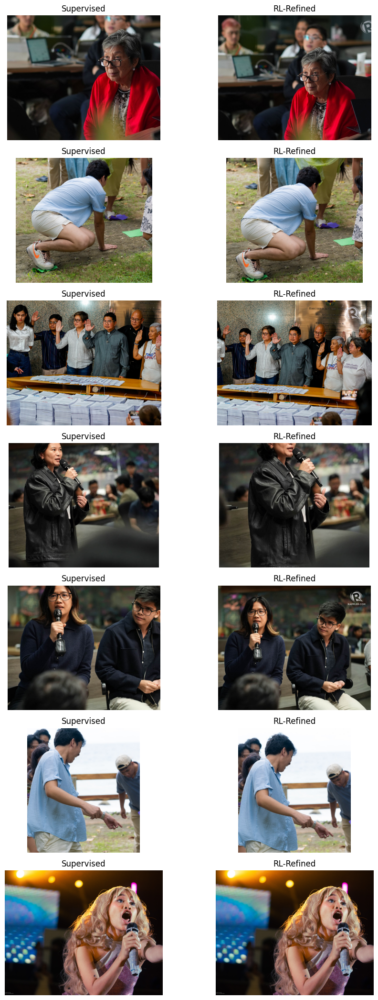

In [34]:
plt.figure(figsize=(10, len(test_images) * 3))

for i, img_path in enumerate(test_images):
    image = cv2.imread(str(img_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Supervised crop
    with torch.no_grad():
        img_tensor = transform(image).unsqueeze(0).to(device)
        pred_box = supervised_model(img_tensor).cpu().numpy()[0]

    init_box = clamp_box(pred_box)

    # RL environment (no true GT)
    env = CropEnv(
        image=image,
        gt_box=dummy_gt_box(),   # weak prior
        init_box=init_box,
        max_steps=50             # keep it subtle
    )

    # Run RL refinement (no training)
    with torch.no_grad():
        run_episode(env, policy)

    supervised_crop = CropEnv(image, dummy_gt_box(), init_box).get_crop()
    rl_crop_test = env.get_crop()

    # Plot
    plt.subplot(len(test_images), 2, i*2 + 1)
    plt.imshow(supervised_crop)
    plt.title("Supervised")
    plt.axis("off")

    plt.subplot(len(test_images), 2, i*2 + 2)
    plt.imshow(rl_crop_test)
    plt.title("RL-Refined")
    plt.axis("off")

plt.tight_layout()
plt.show()
